In [3]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import geopandas as gpd
import numpy as np
from matplotlib.colors import LinearSegmentedColormap
import contextily as ctx
from matplotlib.patches import Rectangle

In [9]:

def plot_accessibility_maps(access_gdf, city_name=None, figsize=(20, 15), save_path=None):
    """
    Plot accessibility maps for all categories in the dataset
    
    Parameters:
    -----------
    access_gdf : GeoDataFrame
        The accessibility data with geometry and category columns
    city_name : str, optional
        Name of the city for the title
    figsize : tuple, optional
        Figure size (width, height)
    save_path : str, optional
        Path to save the figure
    """
    
    # Define the accessibility categories (excluding metadata columns)
    categories = ['mobility', 'health_wellbeing', 'food_choices', 'community_space', 
                  'education', 'nightlife', 'active_living']
    
    # Create subplot grid
    n_categories = len(categories)
    n_cols = 3
    n_rows = int(np.ceil(n_categories / n_cols))
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
    axes = axes.flatten() if n_categories > 1 else [axes]
    
    # Custom colormap (green = accessible, red = less accessible)
    colors = ['#006837', '#31a354', '#78c679', '#c2e699', '#ffffcc', 
              '#fed976', '#fd8d3c', '#fc4e2a', '#bd0026']
    n_bins = 100
    cmap = LinearSegmentedColormap.from_list('accessibility', colors, N=n_bins)
    
    for i, category in enumerate(categories):
        ax = axes[i]
        
        # Convert to Web Mercator for better visualization
        gdf_plot = access_gdf.to_crs(epsg=3857)
        
        # Plot accessibility values
        # Invert values so lower distance = higher accessibility (better)
        max_val = access_gdf[category].max()
        accessibility_score = max_val - access_gdf[category]
        
        gdf_plot.plot(column=accessibility_score, 
                     cmap=cmap, 
                     ax=ax, 
                     markersize=0.5,
                     alpha=0.7,
                     legend=False)
        
        # Add basemap
        try:
            ctx.add_basemap(ax, crs=gdf_plot.crs.to_string(), 
                           source=ctx.providers.CartoDB.Positron, alpha=0.5)
        except:
            pass  # Skip basemap if contextily fails
        
        # Formatting
        ax.set_title(f'{category.replace("_", " ").title()}', fontsize=14, fontweight='bold')
        ax.set_axis_off()
        
        # Add colorbar
        sm = plt.cm.ScalarMappable(cmap=cmap, 
                                  norm=plt.Normalize(vmin=accessibility_score.min(), 
                                                   vmax=accessibility_score.max()))
        sm.set_array([])
        cbar = plt.colorbar(sm, ax=ax, shrink=0.8, aspect=20)
        cbar.set_label('Accessibility Score', rotation=270, labelpad=15)
    
    # Remove empty subplots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])
    
    # Overall title
    if city_name:
        fig.suptitle(f'Urban Accessibility Analysis - {city_name}', 
                    fontsize=18, fontweight='bold', y=0.98)
    else:
        fig.suptitle('Urban Accessibility Analysis', 
                    fontsize=18, fontweight='bold', y=0.98)
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    
    plt.show()

def plot_accessibility_distribution(access_gdf, city_name=None, figsize=(15, 10), save_path=None):
    """
    Plot distribution of accessibility values for each category
    
    Parameters:
    -----------
    access_gdf : GeoDataFrame
        The accessibility data
    city_name : str, optional
        Name of the city for the title
    figsize : tuple, optional
        Figure size (width, height)
    save_path : str, optional
        Path to save the figure
    """
    
    categories = ['mobility', 'health_wellbeing', 'food_choices', 'community_space', 
                  'education', 'nightlife', 'active_living']
    
    fig, axes = plt.subplots(2, 4, figsize=figsize)
    axes = axes.flatten()
    
    for i, category in enumerate(categories):
        ax = axes[i]
        
        # Plot histogram
        ax.hist(access_gdf[category], bins=50, alpha=0.7, color='skyblue', edgecolor='black')
        ax.axvline(access_gdf[category].mean(), color='red', linestyle='--', 
                  label=f'Mean: {access_gdf[category].mean():.0f}m')
        ax.axvline(access_gdf[category].median(), color='orange', linestyle='--', 
                  label=f'Median: {access_gdf[category].median():.0f}m')
        
        ax.set_title(f'{category.replace("_", " ").title()}', fontweight='bold')
        ax.set_xlabel('Distance (meters)')
        ax.set_ylabel('Frequency')
        ax.legend()
        ax.grid(True, alpha=0.3)
    
    # Remove empty subplot
    fig.delaxes(axes[7])
    
    if city_name:
        fig.suptitle(f'Accessibility Distance Distributions - {city_name}', 
                    fontsize=16, fontweight='bold')
    else:
        fig.suptitle('Accessibility Distance Distributions', 
                    fontsize=16, fontweight='bold')
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    
    plt.show()

def plot_accessibility_summary(access_gdf, city_name=None, figsize=(12, 8), save_path=None):
    """
    Plot summary statistics for accessibility
    
    Parameters:
    -----------
    access_gdf : GeoDataFrame
        The accessibility data
    city_name : str, optional
        Name of the city for the title
    figsize : tuple, optional
        Figure size (width, height)
    save_path : str, optional
        Path to save the figure
    """
    
    categories = ['mobility', 'health_wellbeing', 'food_choices', 'community_space', 
                  'education', 'nightlife', 'active_living']
    
    # Calculate summary statistics
    summary_stats = []
    for category in categories:
        stats = {
            'Category': category.replace('_', ' ').title(),
            'Mean Distance (m)': access_gdf[category].mean(),
            'Median Distance (m)': access_gdf[category].median(),
            'Std Distance (m)': access_gdf[category].std(),
            'Min Distance (m)': access_gdf[category].min(),
            'Max Distance (m)': access_gdf[category].max()
        }
        summary_stats.append(stats)
    
    summary_df = pd.DataFrame(summary_stats)
    
    # Create plots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)
    
    # Bar plot of mean distances
    bars = ax1.bar(range(len(categories)), summary_df['Mean Distance (m)'], 
                   color='lightcoral', alpha=0.7, edgecolor='black')
    ax1.set_xlabel('Category')
    ax1.set_ylabel('Mean Distance (meters)')
    ax1.set_title('Average Accessibility Distance by Category')
    ax1.set_xticks(range(len(categories)))
    ax1.set_xticklabels([cat.replace('_', '\n') for cat in categories], rotation=45, ha='right')
    ax1.grid(True, alpha=0.3)
    
    # Add value labels on bars
    for bar, value in zip(bars, summary_df['Mean Distance (m)']):
        ax1.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 50,
                f'{value:.0f}m', ha='center', va='bottom', fontweight='bold')
    
    # Box plot
    data_for_boxplot = [access_gdf[cat] for cat in categories]
    box_plot = ax2.boxplot(data_for_boxplot, labels=[cat.replace('_', '\n') for cat in categories])
    ax2.set_xlabel('Category')
    ax2.set_ylabel('Distance (meters)')
    ax2.set_title('Accessibility Distance Distribution')
    ax2.grid(True, alpha=0.3)
    plt.setp(ax2.get_xticklabels(), rotation=45, ha='right')
    
    if city_name:
        fig.suptitle(f'Accessibility Summary - {city_name}', 
                    fontsize=14, fontweight='bold')
    else:
        fig.suptitle('Accessibility Summary', 
                    fontsize=14, fontweight='bold')
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    
    plt.show()
    
    return summary_df

# Example usage function
def plot_all_accessibility_analysis(csv_path, city_name=None):
    """
    Complete accessibility analysis plotting from CSV file
    
    Parameters:
    -----------
    csv_path : str
        Path to the CSV file with accessibility data
    city_name : str, optional
        Name of the city
    """
    # Load data
    access_df = pd.read_csv(csv_path)
    
    # Convert to GeoDataFrame
    access_gdf = gpd.GeoDataFrame(
        access_df, 
        geometry=gpd.points_from_xy(access_df.x, access_df.y),
        crs='EPSG:4326'
    )
    
    # Get city name from data if not provided
    if city_name is None and 'UC_NM_CTR' in access_df.columns:
        city_name = access_df['UC_NM_CTR'].iloc[0]
    
    print(f"Plotting accessibility analysis for {city_name}")
    print(f"Data points: {len(access_gdf)}")
    
    # Generate all plots
    plot_accessibility_maps(access_gdf, city_name)
    plot_accessibility_distribution(access_gdf, city_name)
    summary_stats = plot_accessibility_summary(access_gdf, city_name)
    
    return access_gdf, summary_stats

# Quick plotting function for loaded data
def quick_plot_accessibility(access_gdf, category='mobility', city_name=None):
    """
    Quick single-category accessibility plot
    
    Parameters:
    -----------
    access_gdf : GeoDataFrame
        The accessibility data
    category : str
        Category to plot
    city_name : str, optional
        Name of the city
    """
    
    fig, ax = plt.subplots(figsize=(10, 8))
    
    # Convert to Web Mercator for visualization
    gdf_plot = access_gdf.to_crs(epsg=3857)
    
    # Plot with inverted values (lower distance = better accessibility)
    max_val = access_gdf[category].max()
    accessibility_score = max_val - access_gdf[category]
    
    gdf_plot.plot(column=accessibility_score, 
                 cmap='RdYlGn', 
                 ax=ax, 
                 markersize=1,
                 alpha=0.8,
                 legend=True,
                 legend_kwds={'shrink': 0.8})
    
    # Add basemap
    try:
        ctx.add_basemap(ax, crs=gdf_plot.crs.to_string(), 
                       source=ctx.providers.CartoDB.Positron, alpha=0.5)
    except:
        pass
    
    title = f'{category.replace("_", " ").title()} Accessibility'
    if city_name:
        title += f' - {city_name}'
    
    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.set_axis_off()
    
    plt.tight_layout()
    plt.show()

Plotting accessibility analysis for Barcelona, Spain
Data points: 272882


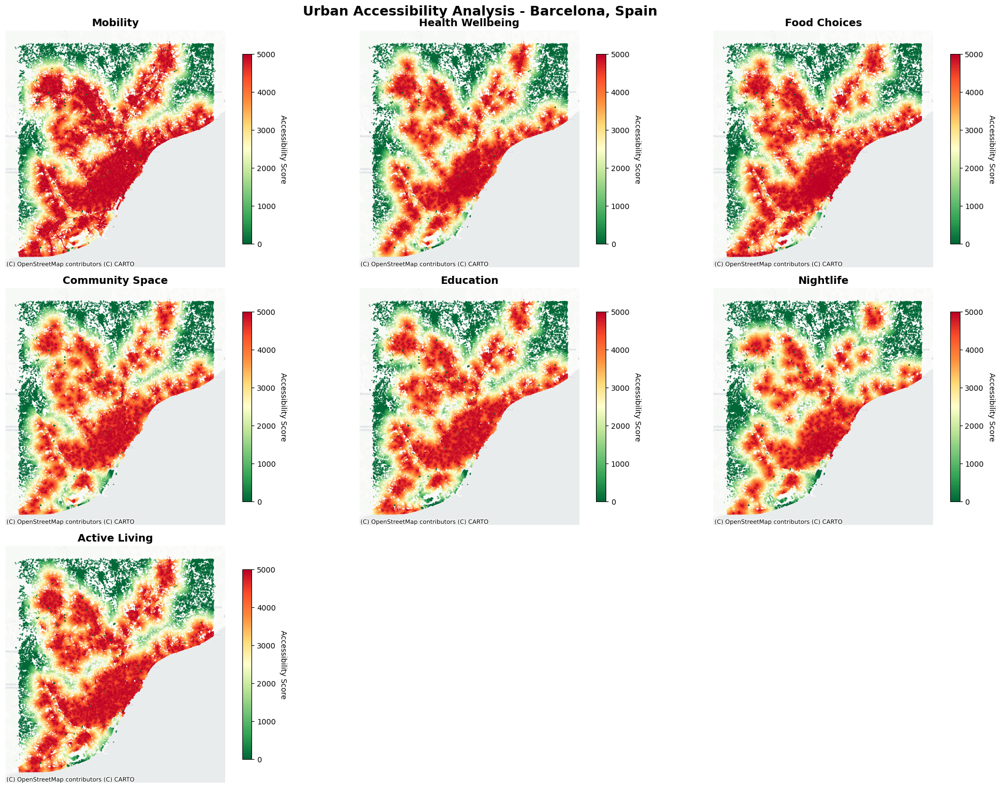

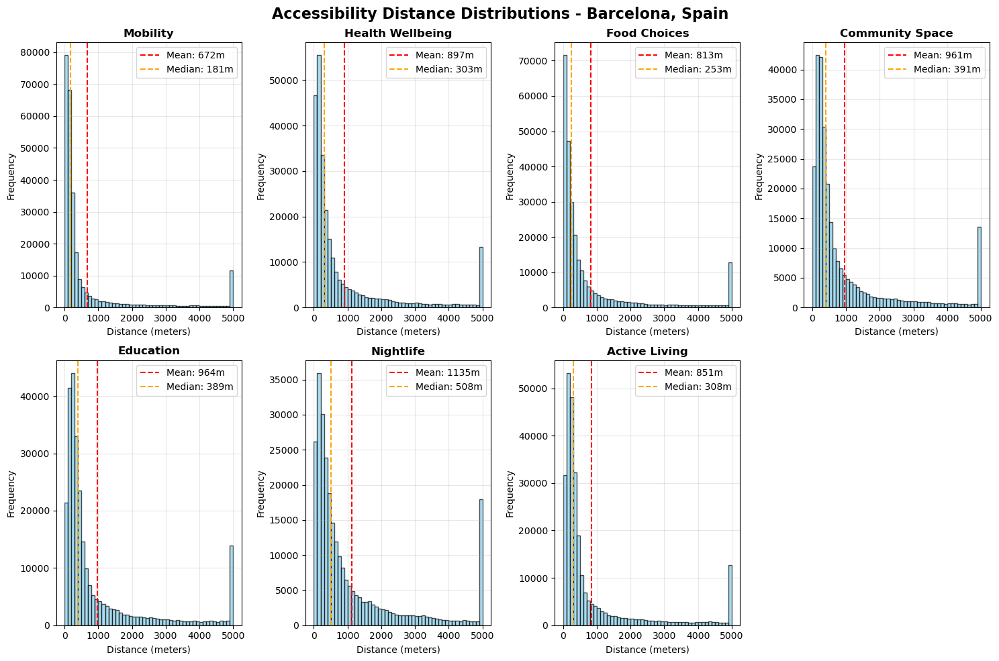

C:\Users\Guillermo\AppData\Local\Temp\ipykernel_5784\782191535.py:200: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  box_plot = ax2.boxplot(data_for_boxplot, labels=[cat.replace('_', '\n') for cat in categories])


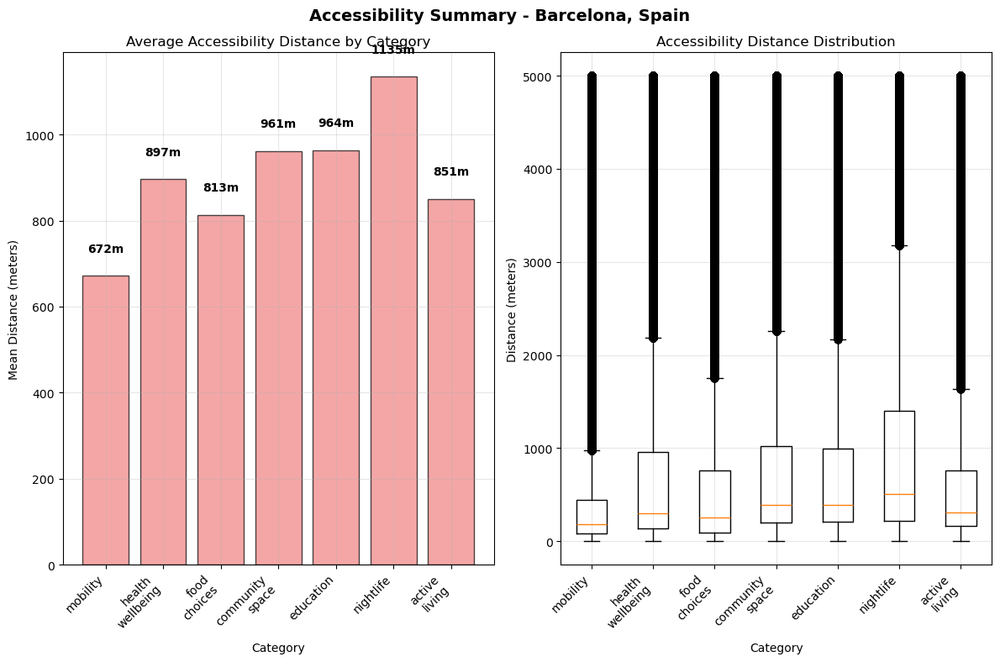

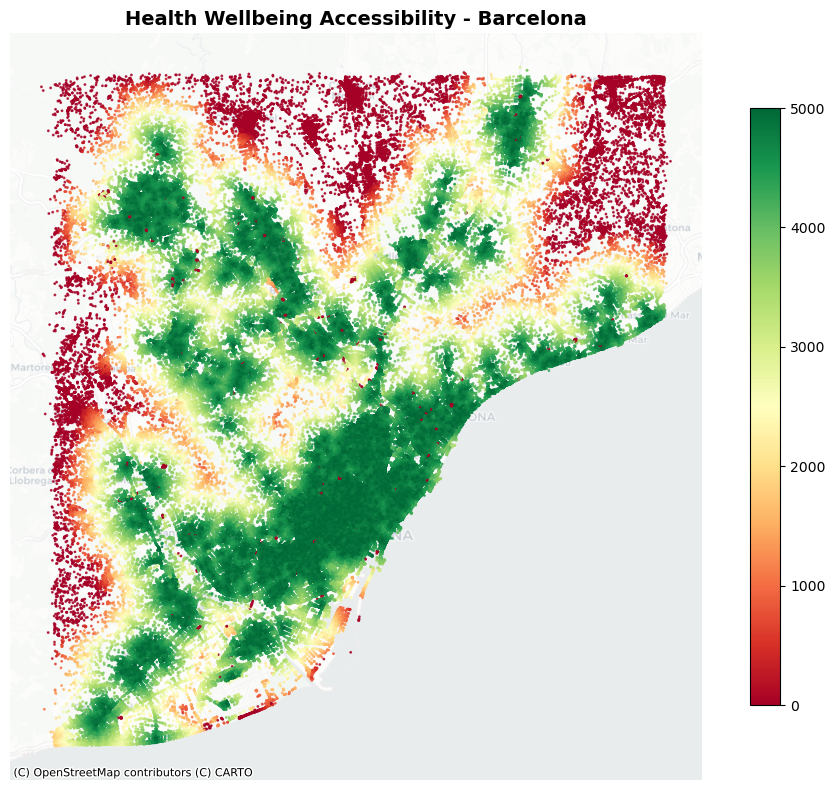

In [8]:
input_path = r"../data/processed/access/2051_2.csv"

# For a complete analysis from CSV:
access_gdf, summary_stats = plot_all_accessibility_analysis(input_path)

# Quick single category plot:
quick_plot_accessibility(access_gdf, category='health_wellbeing', city_name="Barcelona")

In [ ]:


# If you have your data loaded as a GeoDataFrame:
plot_accessibility_maps(access_gdf, city_name="Barcelona, Spain")

## New definition of accessibility

In [11]:

# ... (your data loading and processing code here) ...

def plot_accessibility_maps(access_gdf, city_name=None, figsize=(20, 15), save_path=None):
    """
    Plot accessibility maps for all categories in the dataset

    Parameters:
    -----------
    access_gdf : GeoDataFrame
        The accessibility data with geometry and category columns
    city_name : str, optional
        Name of the city for the title
    figsize : tuple, optional
        Figure size (width, height)
    save_path : str, optional
        Path to save the figure
    """

    # Define the accessibility categories (excluding metadata columns)
    categories = ['mobility', 'health_wellbeing', 'food_choices', 'community_space',
                  'education', 'nightlife', 'active_living']

    # Create subplot grid
    n_categories = len(categories)
    n_cols = 3
    n_rows = int(np.ceil(n_categories / n_cols))

    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
    axes = axes.flatten() if n_categories > 1 else [axes]

    # Custom colormap: Green for low distance (good), Red for high distance (bad)
    # The current list of colors goes from dark green to light yellow, then to dark red.
    # If you want low distance = green, high distance = red, this colormap is correct.
    # '#006837' (dark green) -> '#c2e699' (light green/yellow) -> '#bd0026' (dark red)
    # The current mapping `max_val - access_gdf[category]` makes smaller distances have larger scores.
    # Therefore, a colormap that goes from green (low values of inverted score) to red (high values of inverted score)
    # or vice-versa needs careful consideration.

    # Let's adjust the colormap or the scoring to be super clear:
    # Option A: Colormap where smaller values are "good" (green) and larger values are "bad" (red).
    # Then plot the raw distance.
    # This means green would be at the low end of the distance scale.
    # The default 'RdYlGn_r' (reversed Red-Yellow-Green) colormap is good for this:
    # Red for high values (high distance), Green for low values (low distance).

    # Option B: Calculate an explicit accessibility score from 0-100 where 100 is best.
    # This is what you're trying to do with `max_val - distance`.
    # Let's ensure the colormap aligns:
    # If a higher score means better accessibility (shorter distance), then we want green for high scores.
    # So, a colormap like 'Greens' or a custom one that goes from red (low score) to green (high score)
    # would be appropriate.
    # Let's use your current color scheme, but map it so darker green is for higher scores (better accessibility).

    # Your current 'colors' list for `LinearSegmentedColormap` needs to be considered.
    # If `accessibility_score` is high for good accessibility (low distance),
    # then the colormap should go from red/yellow for low scores to green for high scores.
    colors_for_accessibility_score = ['#bd0026', '#fc4e2a', '#fd8d3c', '#fed976', '#ffffcc',
                                      '#c2e699', '#78c679', '#31a354', '#006837']
    cmap_accessibility = LinearSegmentedColormap.from_list('accessibility_score', colors_for_accessibility_score, N=100)


    for i, category in enumerate(categories):
        ax = axes[i]

        # Convert to Web Mercator for better visualization
        gdf_plot = access_gdf.to_crs(epsg=3857)

        # Calculate a normalized accessibility score (0 to 1, where 1 is best)
        # This makes the score independent of the raw max distance.
        min_dist = access_gdf[category].min()
        max_dist = access_gdf[category].max()
        # If all distances are the same (unlikely but good for robustness), avoid division by zero
        if (max_dist - min_dist) == 0:
            accessibility_score = pd.Series(1.0, index=access_gdf.index)
        else:
            # Invert and normalize: 1 - (normalized distance)
            accessibility_score = 1 - ((access_gdf[category] - min_dist) / (max_dist - min_dist))

        gdf_plot.plot(column=accessibility_score,
                      cmap=cmap_accessibility, # Use the custom colormap
                      ax=ax,
                      markersize=0.5,
                      alpha=0.7,
                      legend=False)

        # Add basemap
        try:
            ctx.add_basemap(ax, crs=gdf_plot.crs.to_string(),
                            source=ctx.providers.CartoDB.Positron, alpha=0.5)
        except Exception as e:
            print(f"Could not add basemap to {category}: {e}") # Debugging for basemap issues
            pass

        # Formatting
        ax.set_title(f'{category.replace("_", " ").title()}', fontsize=14, fontweight='bold')
        ax.set_axis_off()

        # Add colorbar
        sm = plt.cm.ScalarMappable(cmap=cmap_accessibility,
                                   norm=plt.Normalize(vmin=accessibility_score.min(),
                                                     vmax=accessibility_score.max()))
        sm.set_array([])
        cbar = plt.colorbar(sm, ax=ax, shrink=0.8, aspect=20)
        cbar.set_label('Normalized Accessibility Score (0-1)', rotation=270, labelpad=15)


    # Remove empty subplots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    # Overall title
    if city_name:
        fig.suptitle(f'Urban Accessibility Analysis - {city_name}',
                     fontsize=18, fontweight='bold', y=0.98)
    else:
        fig.suptitle('Urban Accessibility Analysis',
                     fontsize=18, fontweight='bold', y=0.98)

    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')

    plt.show()

# Modify quick_plot_accessibility similarly
def quick_plot_accessibility(access_gdf, category='mobility', city_name=None):
    """
    Quick single-category accessibility plot

    Parameters:
    -----------
    access_gdf : GeoDataFrame
        The accessibility data
    category : str
        Category to plot
    city_name : str, optional
        Name of the city
    """

    fig, ax = plt.subplots(figsize=(10, 8))

    # Convert to Web Mercator for visualization
    gdf_plot = access_gdf.to_crs(epsg=3857)

    # Calculate a normalized accessibility score (0 to 1, where 1 is best)
    min_dist = access_gdf[category].min()
    max_dist = access_gdf[category].max()
    if (max_dist - min_dist) == 0:
        accessibility_score = pd.Series(1.0, index=access_gdf.index)
    else:
        accessibility_score = 1 - ((access_gdf[category] - min_dist) / (max_dist - min_dist))

    # Use a diverging colormap or a sequential colormap where high values are green
    # 'RdYlGn' goes from Red (low values) -> Yellow -> Green (high values).
    # Since our `accessibility_score` is 1 for best and 0 for worst, 'RdYlGn' is suitable.
    gdf_plot.plot(column=accessibility_score,
                  cmap='RdYlGn', # Use RdYlGn directly
                  ax=ax,
                  markersize=1,
                  alpha=0.8,
                  legend=True,
                  legend_kwds={'shrink': 0.8, 'label': 'Normalized Accessibility Score'})

    # Add basemap
    try:
        ctx.add_basemap(ax, crs=gdf_plot.crs.to_string(),
                        source=ctx.providers.CartoDB.Positron, alpha=0.5)
    except Exception as e:
        print(f"Could not add basemap: {e}")
        pass

    title = f'{category.replace("_", " ").title()} Accessibility'
    if city_name:
        title += f' - {city_name}'

    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.set_axis_off()

    plt.tight_layout()
    plt.show()

Plotting accessibility analysis for Barcelona, Spain
Data points: 272882


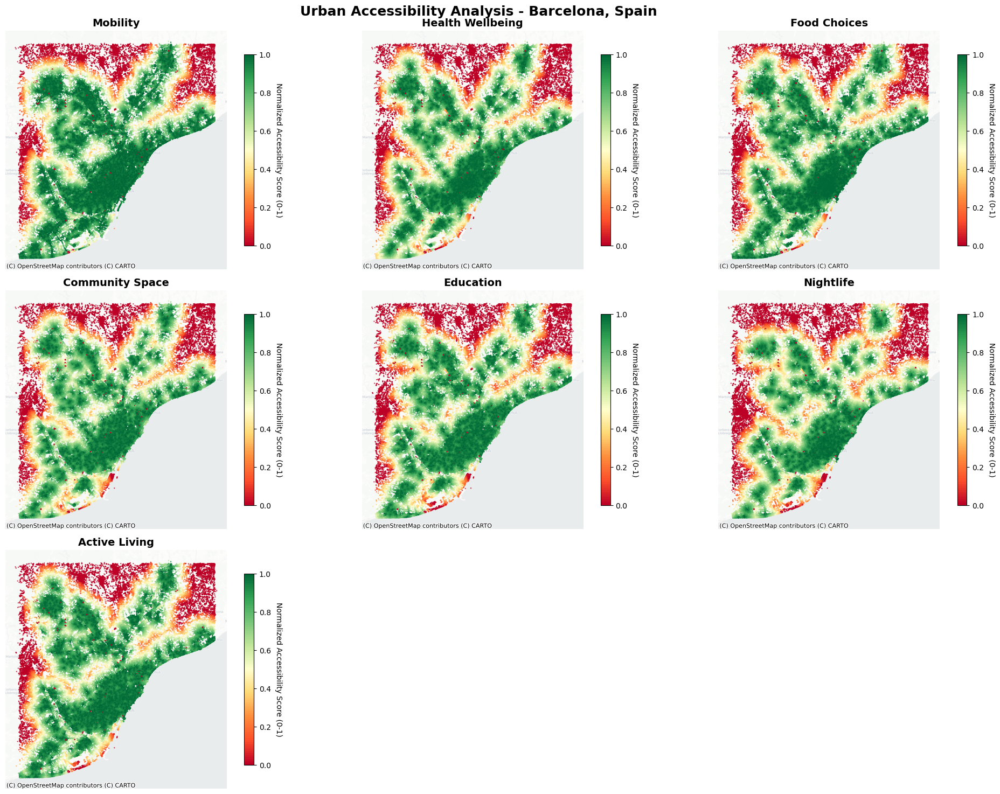

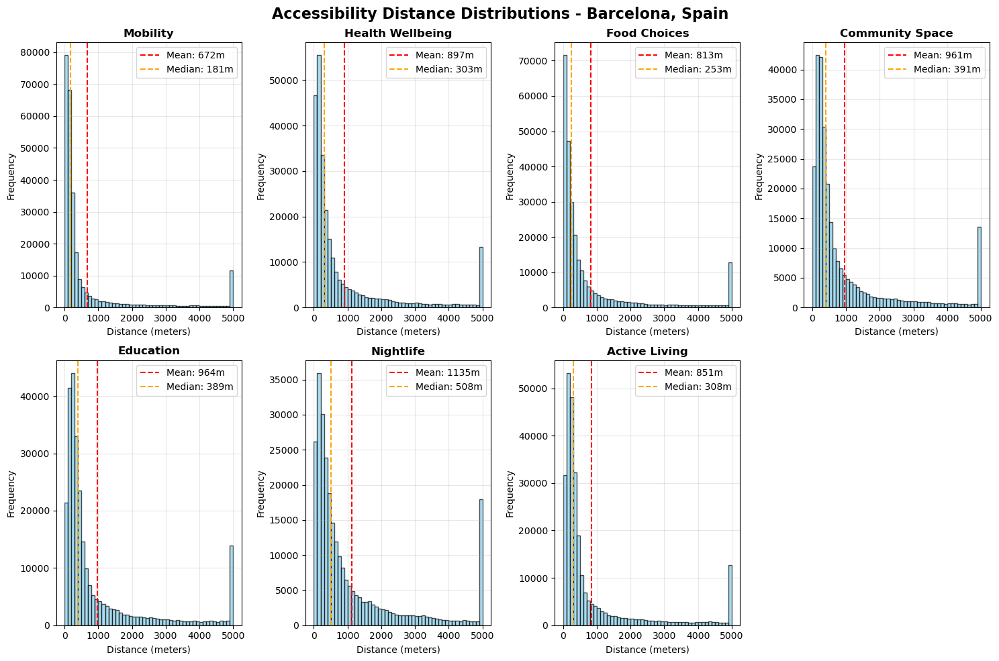

C:\Users\Guillermo\AppData\Local\Temp\ipykernel_5784\782191535.py:200: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  box_plot = ax2.boxplot(data_for_boxplot, labels=[cat.replace('_', '\n') for cat in categories])


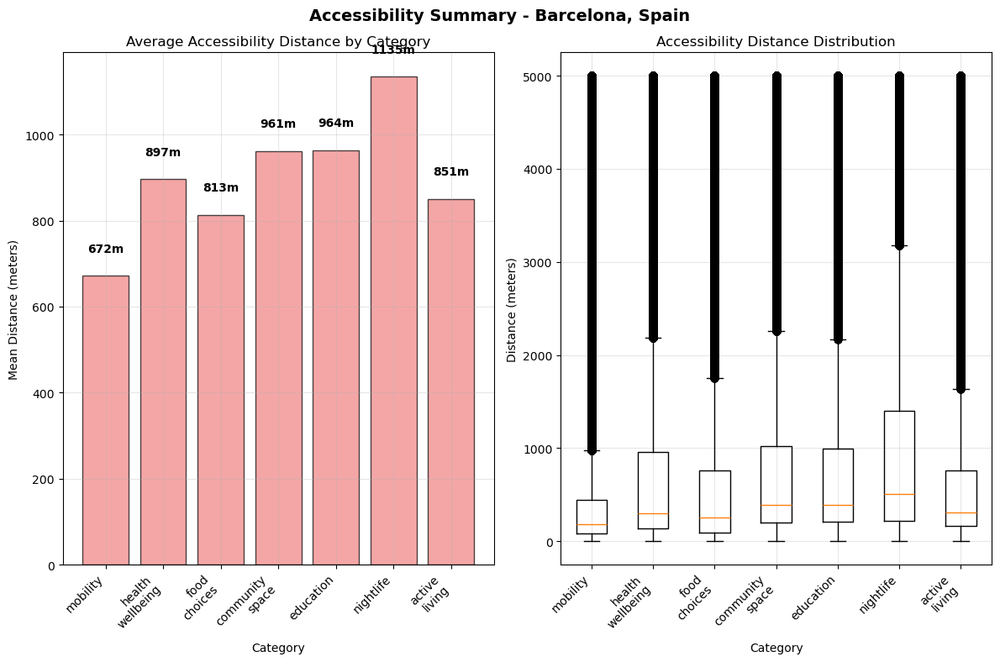

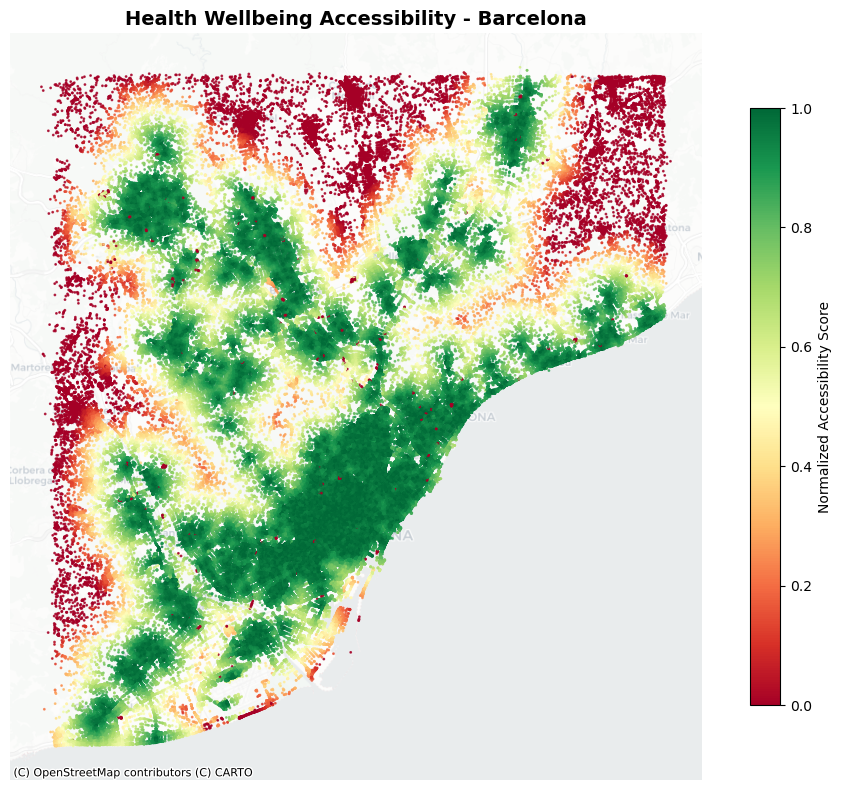

In [12]:
input_path = r"../data/processed/access/2051_2.csv"

# For a complete analysis from CSV:
access_gdf, summary_stats = plot_all_accessibility_analysis(input_path)

# Quick single category plot:
quick_plot_accessibility(access_gdf, category='health_wellbeing', city_name="Barcelona")

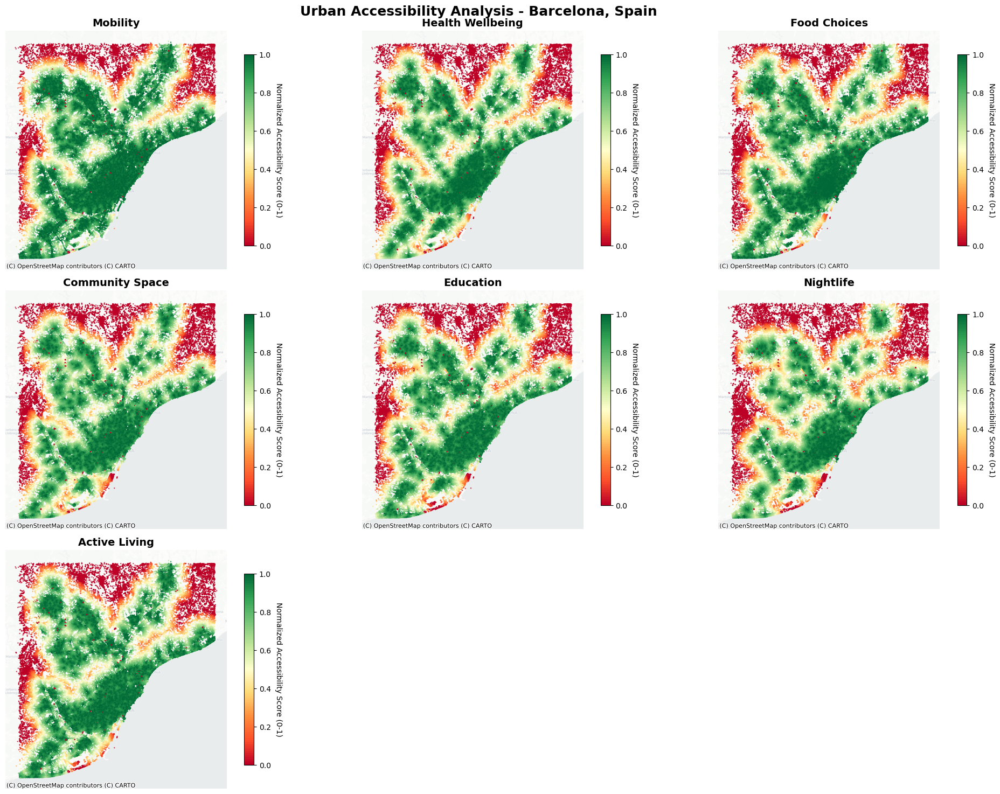

In [13]:


# If you have your data loaded as a GeoDataFrame:
plot_accessibility_maps(access_gdf, city_name="Barcelona, Spain")